# Midterm: Determining Wine Quality

## Module Import

In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd "/content/drive/MyDrive/CSC 310"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/CSC 310


In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import tree

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.metrics import accuracy_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [3]:
# Function for computing confidence intervals from class lecture

def classification_confint(acc, n):
  '''
  Compute the 95% confidence interval for a classification problem.
    acc -- classification accuracy
    n -- number of samples
  Returns a tuple (lb, ub) where lb is the lower bound and ub is the upper bound
  '''
  import math
  interval = 1.96 * math.sqrt((acc * (1 - acc)) / n)
  lb = max(0, acc - interval)
  ub = min(1.0, acc + interval)
  return (lb, ub)

## Data Description

The dataset I'll be evaluating includes numerical information about samples of many red wines, along with a quality score. The quality scores can range from 0-10, and most of the features have to do with the chemical composition of the wine:
 - Fixed acidity
 - Volatile acidity
 - Citric acid
 - Residual sugar
 - Chlorides
 - Free sulfur dioxide
 - Total sulfur dioxide
 - Density
 - pH
 - Sulphates
 - Alcohol  
   
The dataset comes from the [UC Irvine Machine Learning Repository](https://archive.ics.uci.edu/dataset/186/wine+quality). The goal here will be to classify testing data into the correct "quality class", any from 0-10. These are numbers, but still class values, since they are discrete categories.

In [4]:
wine = pd.read_csv("winequality-red.csv", sep = ";")
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


## Data Cleaning

No missing values means nothing to impute, all rows and columns can be used in our analysis.

In [5]:
wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

All feature columns contain continuous numerical measures, so all columns being of float64 types is appropriate. The target (quality) is of int64 type, which is adequate for processing in a decision tree.

In [6]:
wine.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

## Preliminary Data Analysis

The table includes 1599 rows, each of which is a sample of wine. The table also includes 12 columns, of which 11 are features, and 1 is the target variable, as seen in the first few rows.

In [7]:
print(wine.shape)
wine.head()

(1599, 12)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


There are a few interesting things to note by looking at the descriptive statistics. First, based on the difference between 50%, 75%, and max values, nearly all columns contain some large outliers, particularly volatile acidity, citric acid, residual sugar, chlorides, and both sulfur dioxide columns. The max values for these columns are multiple times larger than the mean or even the 75% cutoff values.  
Additionally, we can see that the average 'quality score' is 5.6, which is also the mid-way point between the lowest and highest possible scores. However, we can also see that the lowest score was 3, and the highest score was 8, meaning that the top 2 and bottom 3 possible scores were never actually assigned to any wine. For practical purposes, our target range of classes is now 3-8, instead of 0-10.

In [8]:
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


## Exploratory Analysis

### Variable Distributions

Looking at the below graphs, we can see that most of the data is fairly balanced and normally distributed. Citric acid is an exception here.  
Among the normally distributed features, most are left leaning, including both acidity measures, both sulfur dioxide measures, sulfates, and alcohol. A few others may be considered left leaning, but I've left them out since this is mostly a result of outliers; non-outlier datapoints appear evenly distributed.  
As seen in the dataset's description above, several features have significant outliers, including residual sugar, chlorides, both sulfur dioxide measures, and sulphates. However, these outliers are low in frequency, and don't create an imbalance in the features.

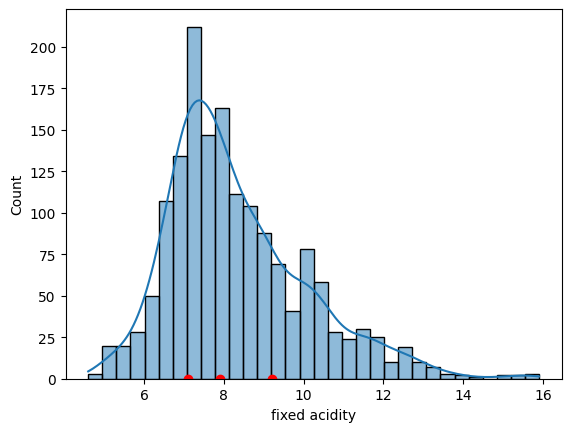

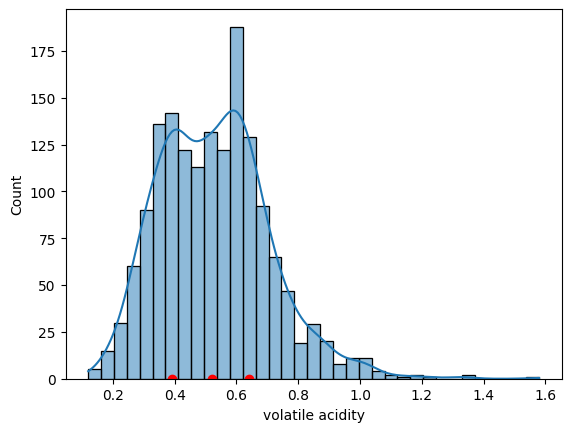

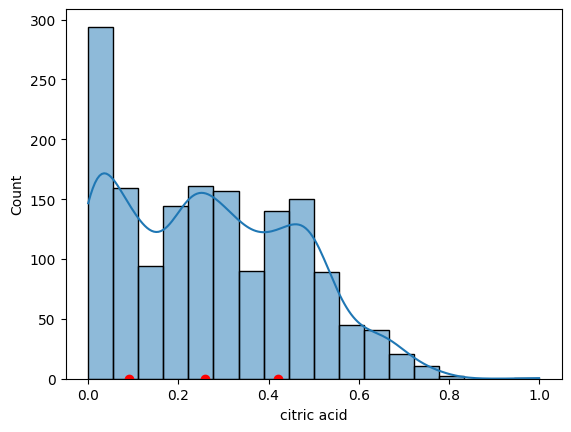

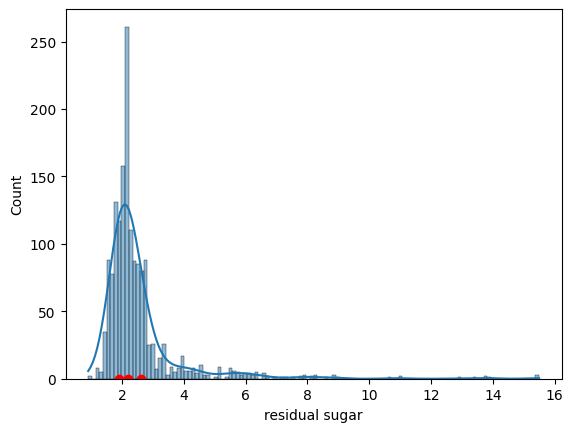

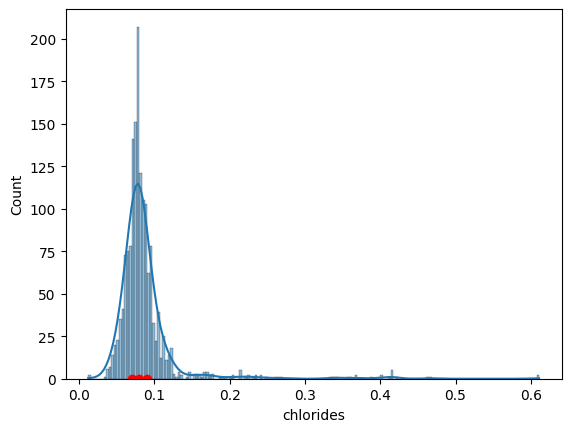

...

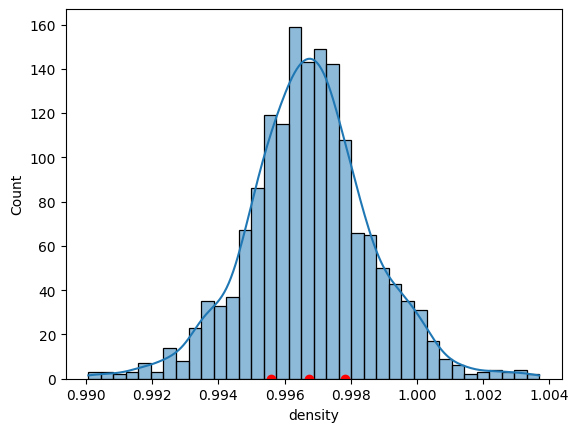

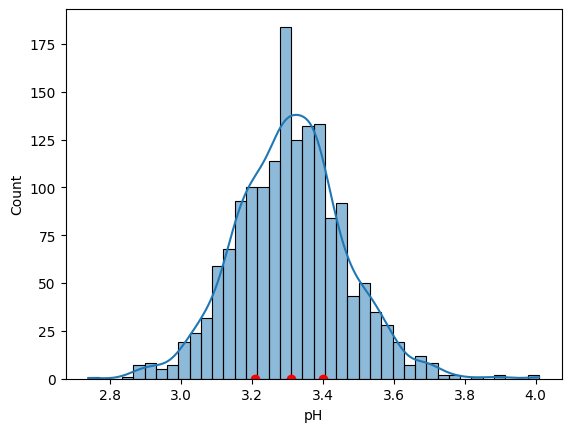

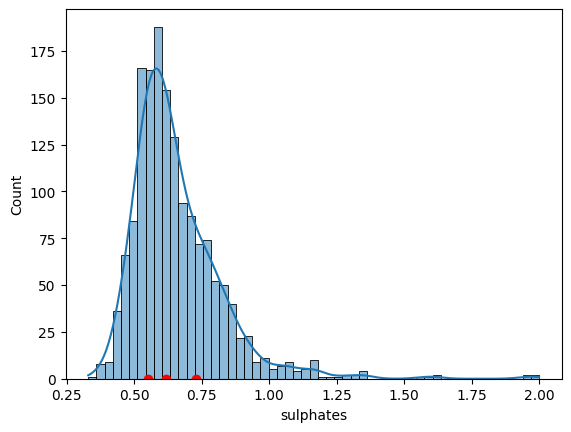

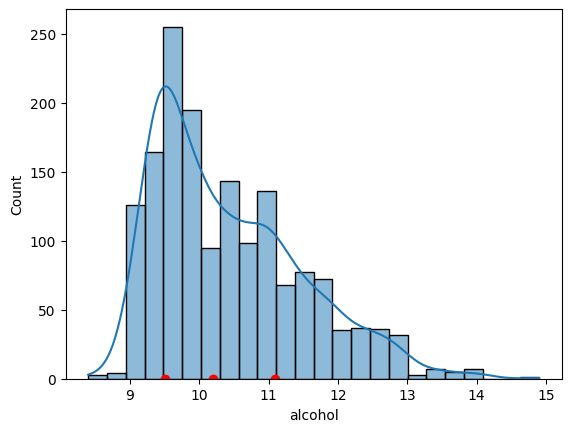

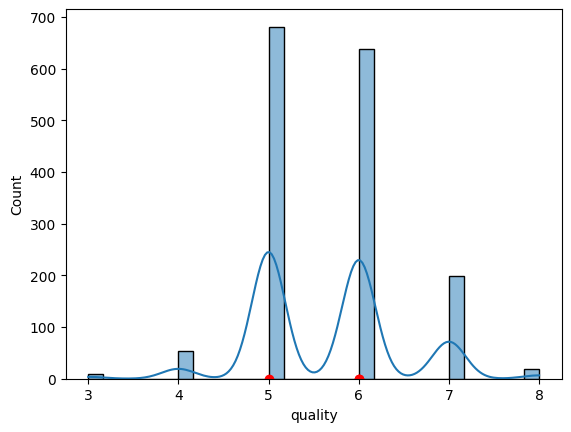

In [9]:
for col in wine.columns:
  percentiles = np.percentile(wine[col], [25, 50, 75])

  sns.histplot(data = wine, x = col, kde = True)
  for percentile in percentiles:
    plt.plot(percentile, 0, 'ro')
  plt.show()

The quality classes are very imbalanced, with very high numbers of wines in classes 5 and 6. Each of those classes contains well over a third of the total, and has more samples than 3, 4, 7, and 8 combined.

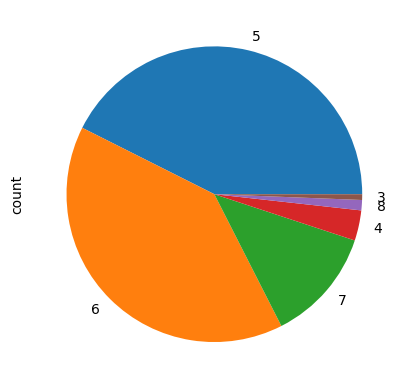

In [10]:
counts = wine['quality'].value_counts()
counts.plot(kind = 'pie')
plt.show()

### Scatter Plots

Despite a very low number of variables having evident correlations, there are a few things worth noting in the cross-variable scatter plot.  
First, there is surprisingly no correlation between fixed and volatile acidity. Fixed acidity is a measurement of how much acid remains in wine when boiled, and these are typically sensed texturally by a drinker. On the other hand, volatile acidity is acid which will evaporate when boiled, and these are aromatic to a drinker. Since there is a chemical distinction between the two types, it makes a bit more sense that they are not correlated.  
Another surprising finding with fixed acidity: it is negatively correlated with pH! Since acids lower pH, this one really makes no sense to me, especially since volatile acidity and pH have no correlation whatsoever, so there is no 'balancing' done by the other acids.  
The last notable trend with fixed acidity is that it correlates positively with density; perhaps the fixed acids are more dense than other components.  
  
The citric acid features also briefly appeared to have some interesting trends. However, some quick research shows that citric acid is one of the compounds which contributes to fixed acidity, so it makes sense that most of the citric acid scatterplots resemble their fixed acidity counterparts, including the weak but visible correlations between citric acid and both density and pH.  
  
The last notable trend is a positive correlation between free sulfur dioxide and total sulfur dioxide. It's not a 1:1 correlation but it's certainly visible on the graph, and this is very intuitive since both are measures of a specific type of molecule, just in different forms.

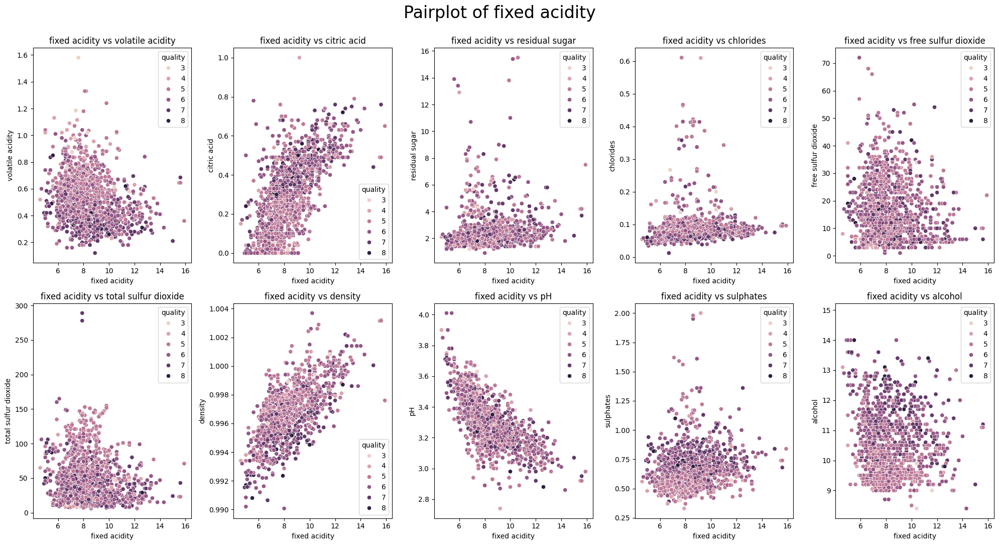

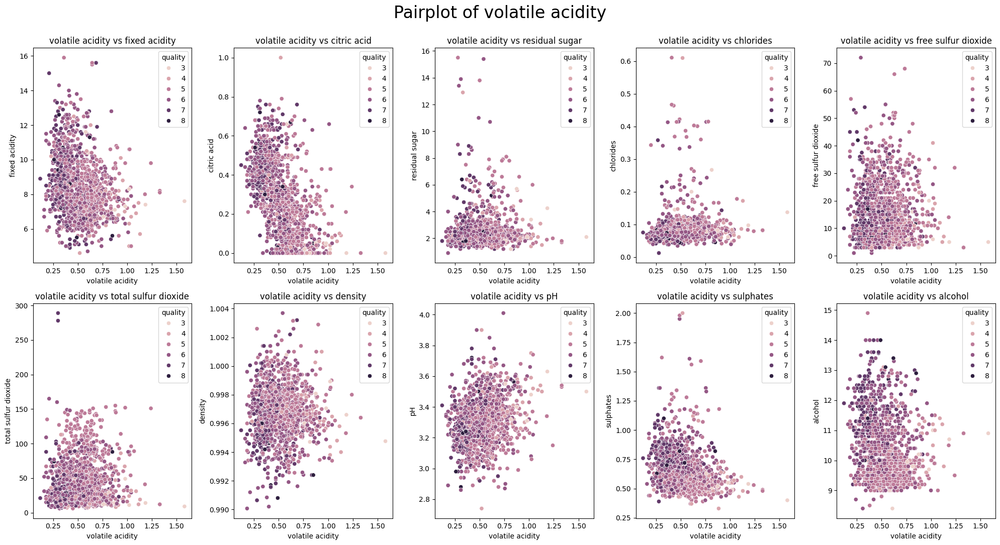

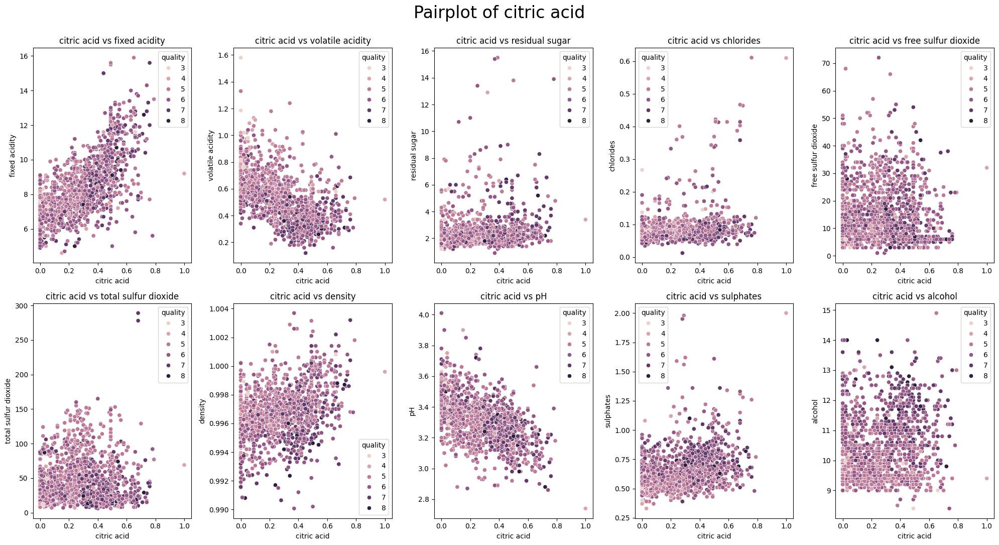

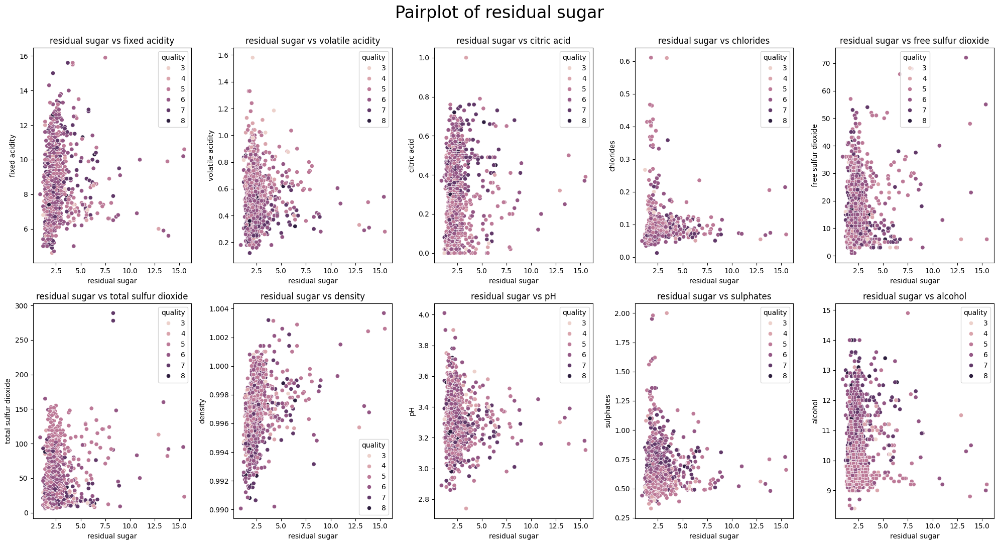

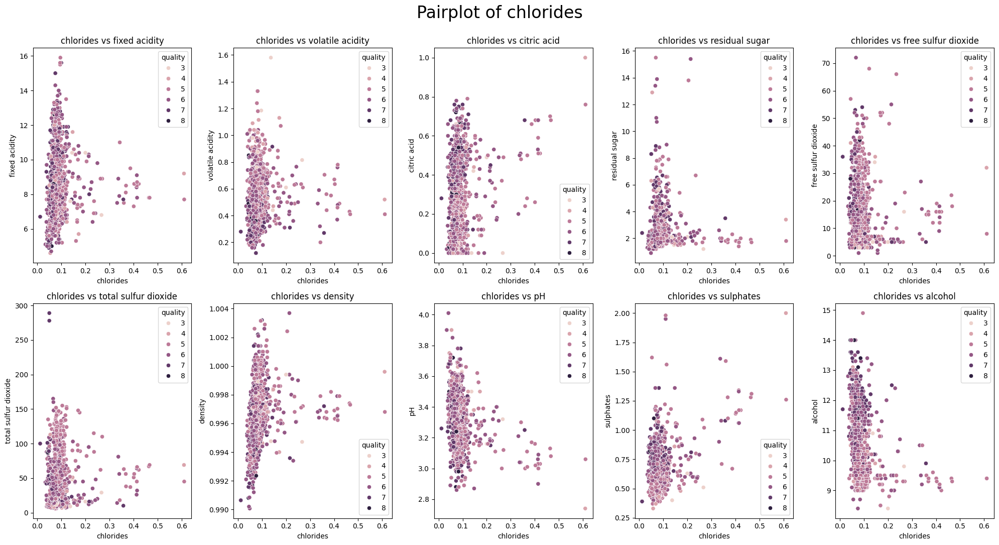

...

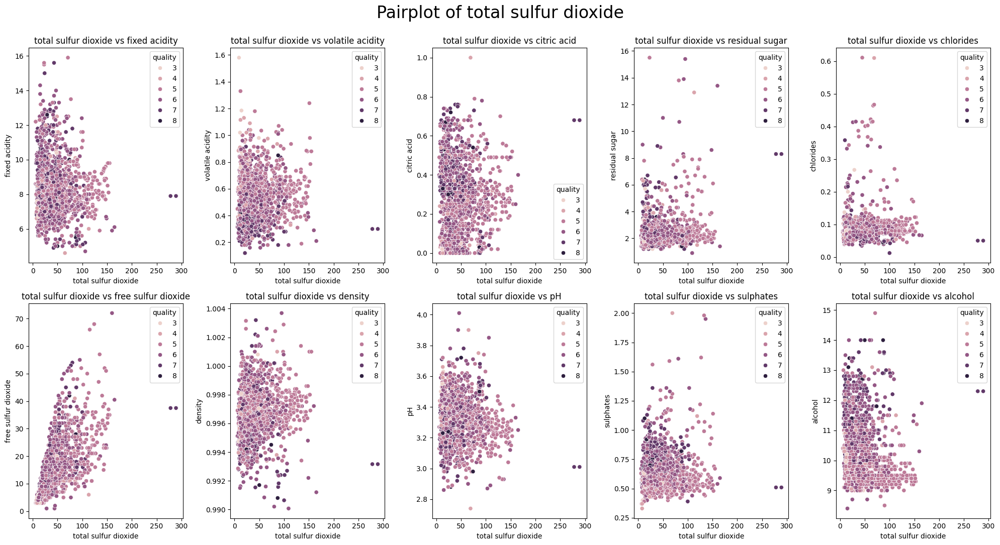

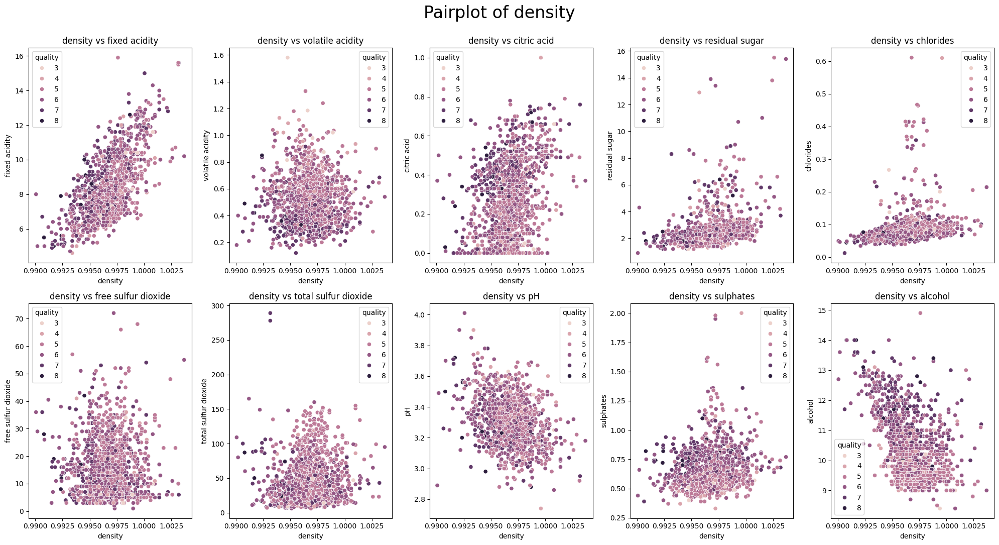

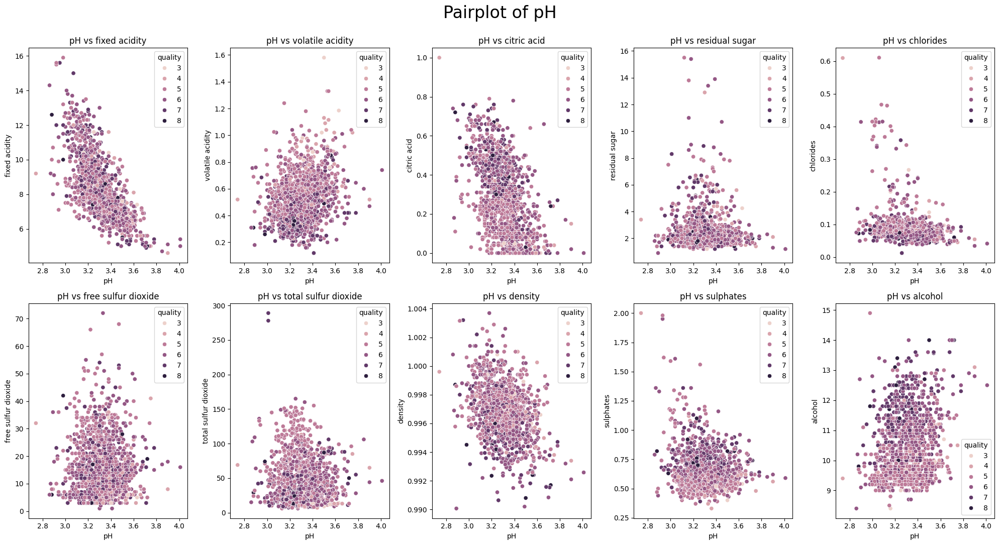

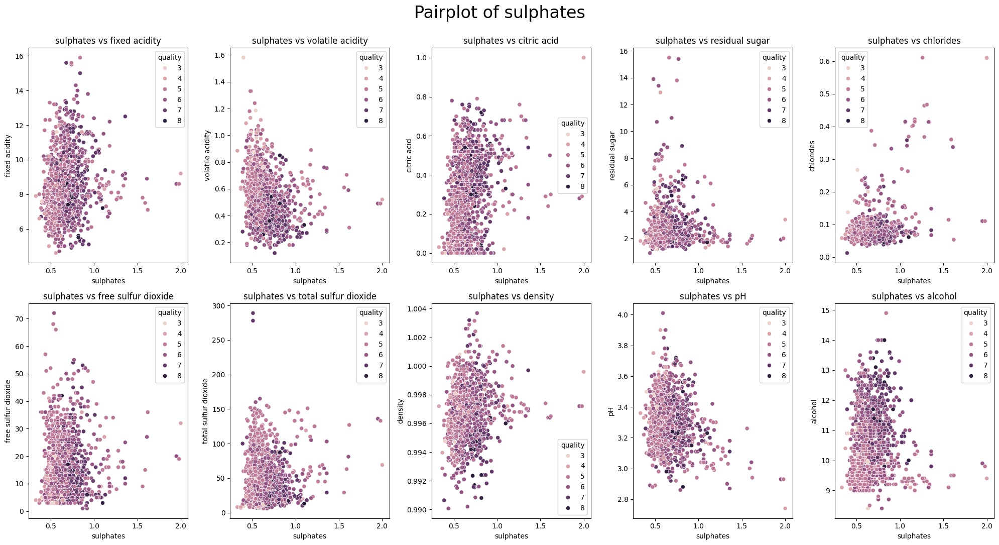

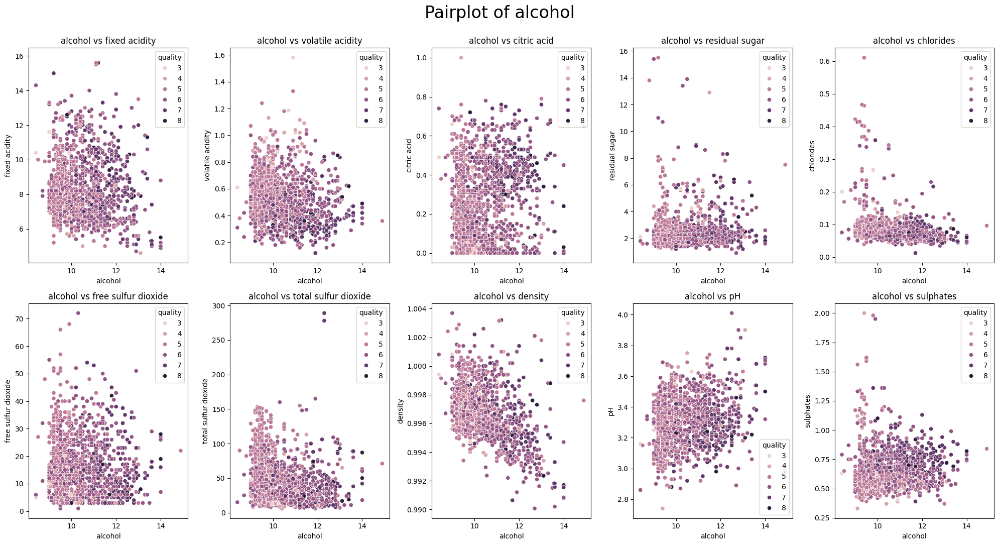

In [11]:
feature_names = [col for col in wine.columns if col != 'quality']

for target_var in feature_names:
  fig, axes = plt.subplots(2, 5, figsize = (20, 12))
  axes = axes.flatten()
  fig.suptitle('Pairplot of {}'.format(target_var), fontsize = 24, y = 0.9)

  other_vars = [col for col in wine.columns if col != target_var and col != 'quality']

  for ax, var in zip(axes, other_vars):
    sns.scatterplot(x = wine[target_var], y = wine[var], ax = ax, hue = 'quality', data = wine)
    ax.set_title(f'{target_var} vs {var}')

  plt.tight_layout(rect = [0, 0, 1, 0.9])
  plt.show()

### Box Plot: Features vs. Target

The last step of our exploratory analysis is comparing the features to the target, as distributed over different target values. In every case, there is clear overlap between the box plots of different quality values, but there are definitely some trends worth noting. Interestingly, the fixed acidity and volatile acidity have opposing trends compared to quality:  
 - Other than the lowest quality score (3), fixed acidity generally, and slowly, goes up as scores go up.  
 - Citric acid, a component of fixed acidity, follows the same general trend.  
 - Volatile acidity has a clearer downward trend as quality scores increase.  

  
The pH also appears to follow a slight upward trend with quality, which would fit with the negative correlation between fixed acidity and pH from above. However, this trend is so small that it may not be meaningful.  
  
Lastly, both sulfates and alcohol appear to increase along with quality, sulfates at a more moderate pace and alcohol rather faster, especially as between each of classes 5, 6, 7, and 8, while the lower quality classes appear to be less separable based on alcohol content.

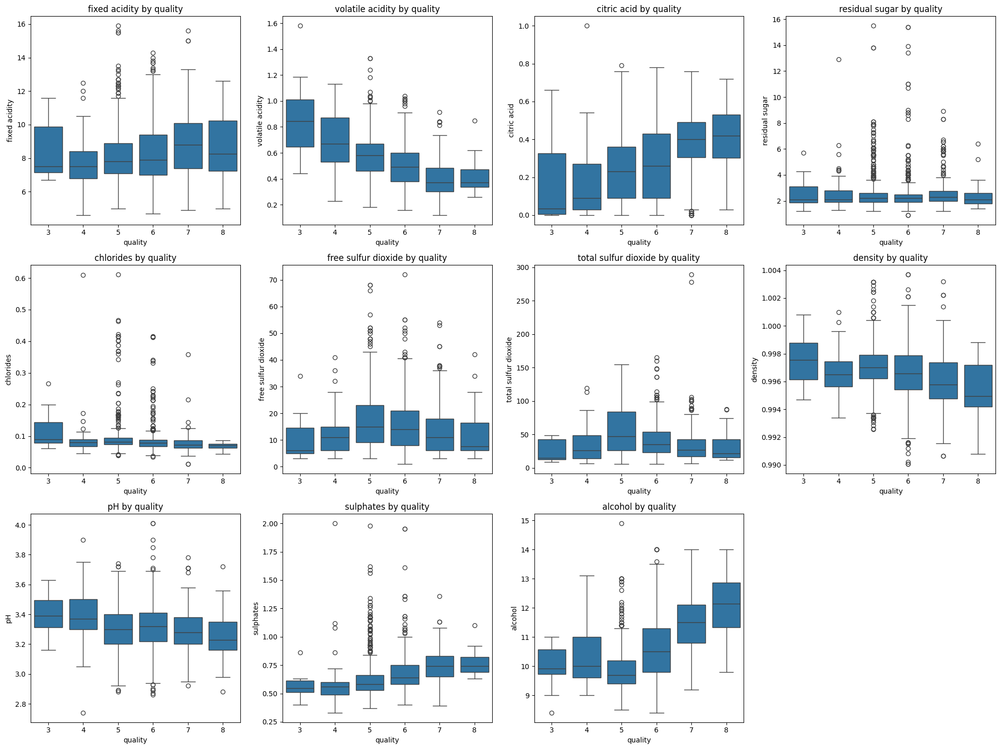

In [12]:
num_plots = len(feature_names)
num_cols = 4
num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize = (20, 15))

axes = axes.flatten()

for ax, feature in zip(axes, feature_names):
  sns.boxplot(x = wine.quality, y = wine[feature], ax = ax)
  ax.set_title(f'{feature} by quality')

for i in range(num_plots, len(axes)):
  fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

## Decision Tree Models

### Data Prep

In [13]:
features = wine.drop(columns = 'quality')
features.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


The features include all variables except the quality, which gets assigned to be the target.

In [14]:
target = wine.quality
target.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

The both the features and the target are split, 80% for training and 20% for testing each, making sure to shuffle the data.

In [15]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, shuffle = True, random_state = 1)

### Unrestricted Tree

A 'complex' decision tree is created, with no specified bounds on depth/model complexity, so the model will go as deep as necessary in order to perfectly fit the data it is trained on. Then it is trained on our training features and target.

In [16]:
complex_tree = tree.DecisionTreeClassifier(criterion = 'entropy', random_state = 5)
complex_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=5)

In [17]:
pred_train = complex_tree.predict(X_train)
pred_test = complex_tree.predict(X_test)
complex_accuracy = accuracy_score(y_train, pred_train)
complex_test_accuracy = accuracy_score(y_test, pred_test)
print(f'Train Accuracy: {complex_accuracy}')
print(f'Test Accuracy: {complex_test_accuracy}')
print(complex_tree.get_depth())

Train Accuracy: 1.0
Test Accuracy: 0.634375
22


The training accuracy is 100%, as expected when a decision tree model is given no maximum depth. However, this leads to 'memorization' of the data. This means that the model is now overfitting by trying to nail down every detail of the training data, even if it's insignificant. Preventing overfitting requires finding a set of parameters which balances the need to be sufficiently complex to learn the important general trends of the data without memorizing facts that won't generalize well.

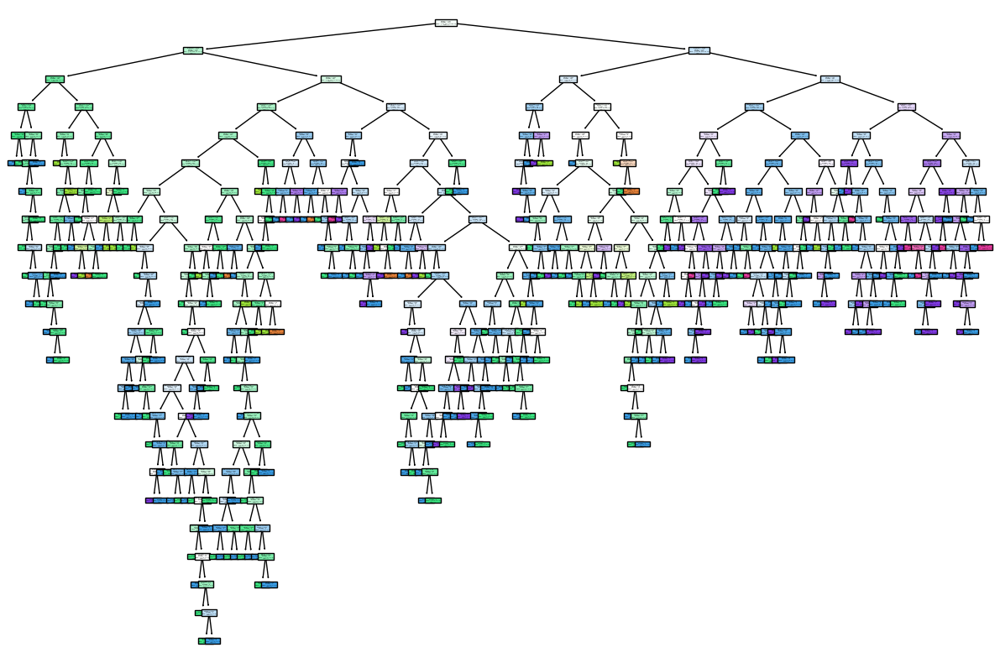

In [18]:
plt.figure(figsize = (15, 10))
tree.plot_tree(complex_tree, filled = True, feature_names = features.columns, class_names = ['3', '4', '5', '6', '7', '8'])
plt.show()

The graph of the tree is a great way to visualize the fact that beyond a certain point, the model is getting into unhelpful minutiae.

### Simple Tree

This time, a 'simple' decision tree is created. The depth of the unbounded model was 22, so this model has been restricted to about one quarter of that depth, and then trained using the same data.

In [19]:
simple_tree = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = 5, random_state = 5)
simple_tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=5)

In [20]:
pred_train = simple_tree.predict(X_train)
pred_test = simple_tree.predict(X_test)
simple_accuracy = accuracy_score(y_train, pred_train)
simple_test_accuracy = accuracy_score(y_test, pred_test)
print(f'Train Accuracy: {simple_accuracy}')
print(f'Test Accuracy: {simple_test_accuracy}')
print(simple_tree.get_depth())

Train Accuracy: 0.655199374511337
Test Accuracy: 0.5875
5


The training accuracy score plummets when the depth is restricted, but interestingly, the testing accuracy has only dropped by about 5%. This indicates two things:

 - First, the model is clearly no longer overfitting. It's actually now underfitting, since not only is testing accuracy low, but training accuracy is as well.
 - Second, when restricted to just 5 decisions of depth, the model doesn't lose too much accuracy on novel data.  
  
This just emphasizes the fact that the previous model overfitted while generalizing poorly, since it barely performed better than an underfitted model.

In [21]:
plt.figure(figsize = (125, 80))
tree.plot_tree(simple_tree, filled = True, feature_names = features.columns, class_names = ['3', '4', '5', '6', '7', '8'], fontsize = 13)
plt.show()

A good visual representation of the underfitting can be seen above by clicking on the bottom row to zoom in. Here you can see that despite reaching the end of the model's capabilities, there are still plenty of leaf nodes containing instances of wine from 3, 4, or even 5 different quality classes.

### Optimal Tree

As mentioned above, in order to prevent over- or under-fitting, the best method is to perform cross-validation and grid searching in order to find the best parameters for the model, rather than trying to manually find them. Here, a 5-fold cross-validation is performed with shuffled data, and then a tree is created. The cross-validation is done to make sure that no particular way of dividing the data results in a  Then the tree is evaluated with either decision-making criterion (gini or entropy) and any depth allowed from 1 to our previous maximum of 22. The grid of models is fitted on the same data used to train the other two, and then the 'best' tree is retrieved from the grid.

In [22]:
cv = KFold(n_splits = 5, shuffle = True, random_state = 10)

dtree = tree.DecisionTreeClassifier(random_state = 10)
param_grid = {
    'max_depth': list(range(1, 22)),
    'criterion': ['gini', 'entropy']
}
grid = GridSearchCV(dtree, param_grid, cv = cv)
grid.fit(X_train, y_train)

best_tree = grid.best_estimator_
scores = cross_val_score(best_tree, X_train, y_train, cv = cv)

print("The best parameters for the model: {}".format(grid.best_params_))
print("The fold accuracy scores for the model: {}".format(scores))
print("The mean CV accuracy of the best model: {}".format(scores.mean()))

The best parameters for the model: {'criterion': 'entropy', 'max_depth': 20}
The fold accuracy scores for the model: [0.60546875 0.6171875  0.58203125 0.6328125  0.6627451 ]
The mean CV accuracy of the best model: 0.6200490196078431


The 'optimal' decision tree model uses entropy as the criterion, same as our other models, and has a maximum depth of 20, which is somewhat less complex than the unrestricted model, but not by much.  
The model has cross-validation scores that range from 58% (about the same as the underfitted tree) to 66% (just a bit better than the overfitted tree). This gives an average of 62% for the model with the 'best' parameters.

In [23]:
pred_train = best_tree.predict(X_train)
pred_test = best_tree.predict(X_test)
best_accuracy = accuracy_score(y_train, pred_train)
best_test_accuracy = accuracy_score(y_test, pred_test)
print(f'Train Accuracy: {best_accuracy}')
print(f'Test Accuracy: {best_test_accuracy}')
print(best_tree.get_depth())

Train Accuracy: 0.9992181391712275
Test Accuracy: 0.640625
20


This model's training is 99%, and its testing accuracy is 64%. Unfortunately, this looks a lot like our overfitted, unrestricted model, both in terms of model parameters (criterion: entropy, and depths of 22 vs. 20) and in terms of both accuracy scores. However, having done cross validation and the grid search, we know that this is likely the best we can do.  
  
  

Now that we've got three models, it's difficult to say which is best. The underfitted model has the worst accuracy, but not by much, and it's far less complex than the other two models. The complex model is clearly overfitted and has just memorized it's data, but the 'optimal' model has done nearly the same thing, and barely has a better accuracy. All told, the 'optimal' model is gives the best balance between over- and under-fitting as well as the best accuracy, but by examining the exact figures, it's clear that it's the best of a bad group of choices.

### 10% Worse Tree

In order to find a model which performs 90% as well as the 'optimal' model (just 10% worse), the depth will start at the minimum (1) and increment until sufficient testing accuracy score is met. As it turns out, it only takes a depth of 1 decision to reach an accuracy within 10% of our 'optimal' model's quality.

In [24]:
depth = 1
sufficient_accuracy = False
while not sufficient_accuracy:
  ten_percent_worse_model = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = depth)
  ten_percent_worse_model.fit(X_train, y_train)
  pred = ten_percent_worse_model.predict(X_test)
  accuracy = accuracy_score(y_test, pred)
  if accuracy >= grid.best_score_ * 0.9:
    sufficient_accuracy = True
  else:
    depth += 1
  print(depth, accuracy)

1 0.590625


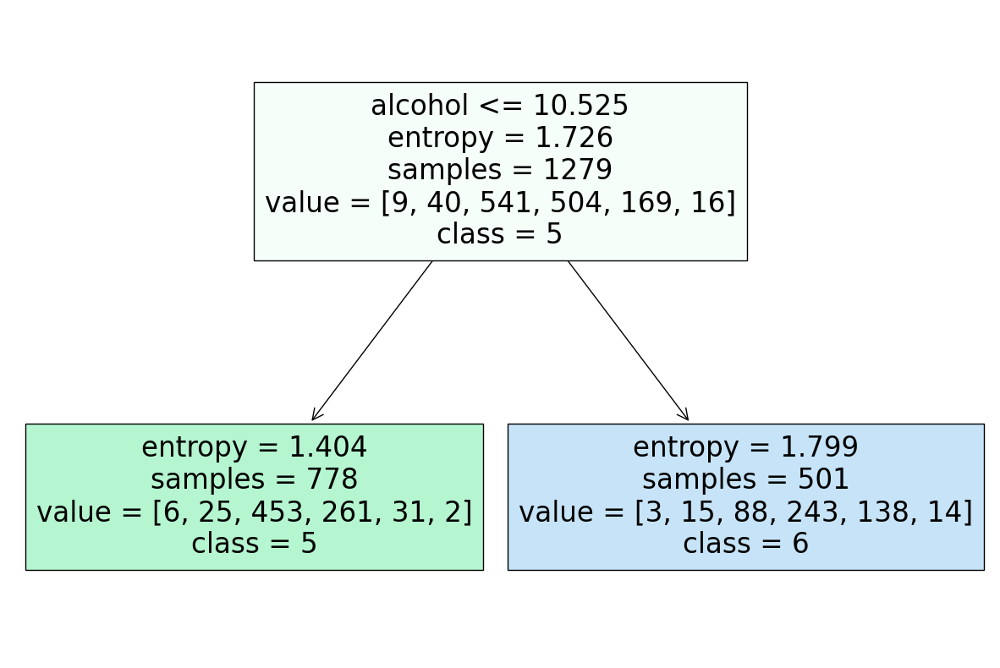

In [25]:
plt.figure(figsize = (15, 10))
tree.plot_tree(ten_percent_worse_model, filled = True, feature_names = features.columns, class_names = ['3', '4', '5', '6', '7', '8'])
plt.show()

From the tree, one can see that there isn't much to be had in terms of deeper insights into the data. The first decision in this tree is the same as all the previous trees, reinforcing the fact that alcohol content is an important factor, but this could've been gleaned from any of the other trees as well.  
Probably the greatest insight available is that all previous attempts at modeling have barely done better than a single decision is capable of.

## Model Evaluation

In [26]:
optimal_score = accuracy_score(y_test, best_tree.predict(X_test))
print(f'Optimal Tree Accuracy: {optimal_score}')

ten_percent_worse_score = accuracy_score(y_test, ten_percent_worse_model.predict(X_test))
print(f'10% Worse Tree Accuracy: {ten_percent_worse_score}')

Optimal Tree Accuracy: 0.640625
10% Worse Tree Accuracy: 0.590625


In [27]:
balanced_optimal_score = balanced_accuracy_score(y_test, best_tree.predict(X_test))
print(f'Optimal Tree Balanced Accuracy: {balanced_optimal_score}')

balanced_ten_percent_worse_score = balanced_accuracy_score(y_test, ten_percent_worse_model.predict(X_test))
print(f'10% Worse Tree Balanced Accuracy: {balanced_ten_percent_worse_score}')

Optimal Tree Balanced Accuracy: 0.40761440052484826
10% Worse Tree Balanced Accuracy: 0.22857142857142856


It's worth noting that despite the 10% worse model's 'general accuracy' being near to the optimal model's, it's balanced accuracy is half that of the optimal model. As can be seen in the decision tree visual above, or the confusion matrix below, the worse model will only ever predict a wine to be of quality class 5 or 6, so the other classes have terrible scores that drag down the balanced accuracy.

In [28]:
optimal_precision = precision_score(y_test, best_tree.predict(X_test), average = 'weighted')
print(f'Optimal Tree Precision: {optimal_precision}')

ten_percent_worse_precision = precision_score(y_test, ten_percent_worse_model.predict(X_test), average = 'weighted')
print(f'10% Worse Tree Precision: {ten_percent_worse_precision}')

Optimal Tree Precision: 0.6349000206984206
10% Worse Tree Precision: 0.5043332449628843


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


The optimal tree also beats the worse model by 13% in precision, meaning it has fewer false positives. 63% is still not a great score, but it is doing better than the oversimplified model, again likely because of the oversimplified model's lack of ability to classify any samples as being of classes 3, 4, 7, or 8.

In [29]:
optimal_recall = recall_score(y_test, best_tree.predict(X_test), average = 'weighted')
print(f'Optimal Tree Recall: {optimal_recall}')

ten_percent_worse_recall = recall_score(y_test, ten_percent_worse_model.predict(X_test), average = 'weighted')
print(f'10% Worse Tree Recall: {ten_percent_worse_recall}')

Optimal Tree Recall: 0.640625
10% Worse Tree Recall: 0.590625


Once again with recall, neither model gets a great score, but the optimal model does slightly outperform the worse model. Since the classes in this data set are not a dichotomy, false negatives means something a little different than when used with simple yes/no or other binary questions, but the worse model clearly produces more.

In [30]:
labels = list(range(3, 9))

optimal_cm = confusion_matrix(y_true = y_test, y_pred = best_tree.predict(X_test))
om_df = pd.DataFrame(optimal_cm, index = labels, columns = labels)
om_df.index.name = 'Actual'
om_df.columns.name = 'Predicted'
print(f'Optimal Tree Confusion Matrix: \n\n{om_df}')

ten_percent_worse_cm = confusion_matrix(y_test, ten_percent_worse_model.predict(X_test))
t_df = pd.DataFrame(ten_percent_worse_cm, index = labels, columns = labels)
t_df.index.name = 'Actual'
t_df.columns.name = 'Predicted'
print(f'\n\n\n10% Worse Tree Confusion Matrix: \n\n{t_df}')

Optimal Tree Confusion Matrix: 

Predicted  3  4    5   6   7  8
Actual                         
3          0  0    1   0   0  0
4          0  1    7   3   1  1
5          1  1  107  28   3  0
6          0  4   31  81  17  1
7          0  0    5  10  15  0
8          0  0    0   0   1  1



10% Worse Tree Confusion Matrix: 

Predicted  3  4    5   6  7  8
Actual                        
3          0  0    1   0  0  0
4          0  0    9   4  0  0
5          0  0  122  18  0  0
6          0  0   67  67  0  0
7          0  0    6  24  0  0
8          0  0    0   2  0  0


The confusion matrices provide a few neat visuals. First, we can see that the most common results for the optimal tree are to correctly classify 5 as 5, or 6 as 6. The same is true, to a lesser degree, of the 10% worse model. You can also see that there are plenty of mistakes in both models, with plenty of instances of samples not falling along the primary diagonal of correctly identified samples. This is especially true with the worse model, where 67 samples were predicted to be 5 but actually of class 6, the same number correctly classified as class 6.  
As mentioned above, it's also clear from looking at the 'Predicted' columns that the worse model is only capable of guessing class 5 or class 6, wines of other classes will never be correctly identified.

In [31]:
print(classification_report(y_test, best_tree.predict(X_test)))
print(classification_report(y_test, ten_percent_worse_model.predict(X_test)))

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.17      0.08      0.11        13
           5       0.71      0.76      0.74       140
           6       0.66      0.60      0.63       134
           7       0.41      0.50      0.45        30
           8       0.33      0.50      0.40         2

    accuracy                           0.64       320
   macro avg       0.38      0.41      0.39       320
weighted avg       0.63      0.64      0.64       320

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         1
           4       0.00      0.00      0.00        13
           5       0.60      0.87      0.71       140
           6       0.58      0.50      0.54       134
           7       0.00      0.00      0.00        30
           8       0.00      0.00      0.00         2

    accuracy                           0.59       320
   macro avg       0.20

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


The classification report can be used to visualize some of the above statistics in greater detail per class. This way, one can see exactly how the precision and recall scores contrast between models:
 - The precision for any class besides 5 or 6 is 0 for the worse model, whereas the precision for the optimal model is low but non-zero.
 - The recall for any class besides 5 or 6 is 0 for the worse model, where as the optimal model again has low but non-zero scores, which make up for the worse model having slightly better recall in it's 'favored' classes.

## Complexity and Confidence

In [32]:
print('Optimal tree complexity: {}\n10% worse model complexity: {}'.format(best_tree.get_depth(), ten_percent_worse_model.get_depth()))

Optimal tree complexity: 20
10% worse model complexity: 1


As we've already seen, the worse model manages to do all of its work with a single decision, while the 'optimal' model needs to go 20 decisions deep.

In [33]:
optimal_ci = classification_confint(optimal_score, len(y_test))
ten_percent_worse_ci = classification_confint(ten_percent_worse_score, len(y_test))

print("Optimal Tree Confidence Interval: ({:3.2f}, {:3.2f})".format(optimal_ci[0], optimal_ci[1]))
print("10% Worse Tree Confidence Interval: ({:3.2f}, {:3.2f})".format(ten_percent_worse_ci[0], ten_percent_worse_ci[1]))

Optimal Tree Confidence Interval: (0.59, 0.69)
10% Worse Tree Confidence Interval: (0.54, 0.64)


Interestingly, the confidence intervals of both models are 10 percentage points wide. Also, the top 5% of the 'worse' model's interval overlaps with the bottom 5% of the 'optimal' model's interval, which calls into question the terminology of 'worse' and 'optimal'. This is because now we can't even say with certainty that the 'optimal' model will actually perform better, it's true accuracy could lie below that of the 'worse' model.  
With this in mind, I suppose which model you would use would mostly be a question of context. The 'worse' model clearly is far more efficient with it's single decision, and if I just wanted to classify wines into 'better' or 'worse' categories, I'd choose this model. However, if the depth and computational cost of the 'optimal' model are acceptable, I would probably prefer to use this model for it's better advanced metrics, like precision and recall. It may not actually be more accurate (based on confidence intervals) but at least it is capable of assigning to classes 3, 4, 7, and 8.  
However, I think the real takeaway here is that a decision tree is just not the best way to go about solving this problem. The 'optimal' model is hardly better than a single decision based on 1 of 11 features, so if I were tasked with building a successful model, I would scrap both and try another approach.